In [3]:
from google.colab import files
uploaded = files.upload()

Saving credit_card_transactions.csv to credit_card_transactions.csv


In [5]:
import pandas as pd

file_name = "credit_card_transactions.csv"  # Change this to match your uploaded file name
df = pd.read_csv(file_name)
df.head()  # Display first few rows

,trans_date_trans_time,category,first,last,gender,street,city,state,lat,long,city_pop,dob,is_fraud
0,2019-01-01 0:00,misc_net,Jennifer,Banks,F,561 Perry Cove,Moravian Falls,NC,36.0788,-81.1781,3495,1988-03-09,0
1,2019-01-01 0:00,grocery_pos,Stephanie,Gill,F,43039 Riley Greens Suite 393,Orient,WA,48.8878,-118.2105,149,1978-06-21,0
2,2019-01-01 0:00,entertainment,Edward,Sanchez,M,594 White Dale Suite 530,Malad City,ID,42.1808,-112.2620,4154,1962-01-19,0
3,2019-01-01 0:01,gas_transport,Jeremy,White,M,9443 Cynthia Court Apt. 038,Boulder,MT,46.2306,-112.1138,1939,1967-01-12,0
4,2019-01-01 0:03,misc_pos,Tyler,Garcia,M,408 Bradley Rest,Doe Hill,VA,38.4207,-79.4629,99,1986-03-28,0


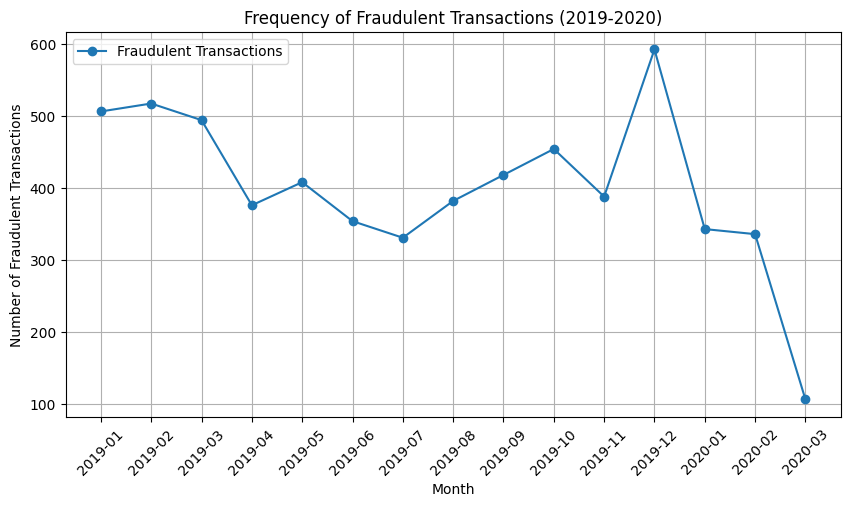

In [6]:
import pandas as pd
import matplotlib.pyplot as plt

# Ensure the dataset has a date column and fraud status column
date_column = "trans_date_trans_time"  # Change this if needed
fraud_column = "is_fraud"  # Change this if needed

# Convert the date column to datetime format
df[date_column] = pd.to_datetime(df[date_column])

# Group fraudulent transactions by month
df['month'] = df[date_column].dt.to_period('M')
fraud_counts = df[df[fraud_column] == 1].groupby('month').size()

# Plot the line chart
plt.figure(figsize=(10, 5))
plt.plot(fraud_counts.index.astype(str), fraud_counts.values, marker='o', linestyle='-', label="Fraudulent Transactions")
plt.xlabel("Month")
plt.ylabel("Number of Fraudulent Transactions")
plt.title("Frequency of Fraudulent Transactions (2019-2020)")
plt.xticks(rotation=45)
plt.legend()
plt.grid(True)

# Show the plot
plt.show()

# **Conclusions Based on the Fraudulent Transactions Trend (2019-2020) Seasonal Variation in Fraudulent Transactions:**

Seasonal Trends in Fraudulent Transactions

Fraud cases remain relatively high at the beginning of 2019, peaking above 500 cases in January and February 2019.
A drop is observed from March to June 2019, suggesting either improved fraud detection measures or seasonal shifts in fraudulent activities.
Fraud increases again from July to December 2019, peaking sharply in December 2019, likely due to holiday shopping and increased transaction volume.

Sharp Decline in Fraud Cases in Early 2020

A significant drop in fraud cases starts in January 2020, with a steep decline in March 2020 reaching almost 100 cases.
This could be linked to new fraud prevention strategies, economic changes, or shifts in transaction behavior due to the COVID-19 pandemic.

December 2019 Peak Suggests Holiday Fraud Risks

Fraud cases spike drastically in December 2019, exceeding 600 cases.
This aligns with holiday shopping trends, when fraudulent transactions are typically higher due to:
Increased online purchases.
More card-not-present (CNP) transactions.
High volume of gift card and account takeover fraud.

Possible COVID-19 Effect on Fraud in 2020

The rapid decline in fraud cases in early 2020, particularly in March 2020, might be related to COVID-19 lockdowns.
Possible explanations:
Reduced transactions overall due to economic slowdown.
Tighter security measures as businesses adapted to digital fraud threats.
Changes in fraudster behavior, shifting from in-person fraud to digital scams.

Key Takeaways

📌 Fraudulent transactions peaked in December 2019, likely due to holiday shopping fraud.

📉 A steady decline in early 2020, potentially linked to COVID-19 lockdowns and economic shifts.

🛑 Fraud prevention measures may have been effective after December 2019, leading to a drop.

📊 Seasonal variations in fraud should be considered when designing fraud prevention strategies.

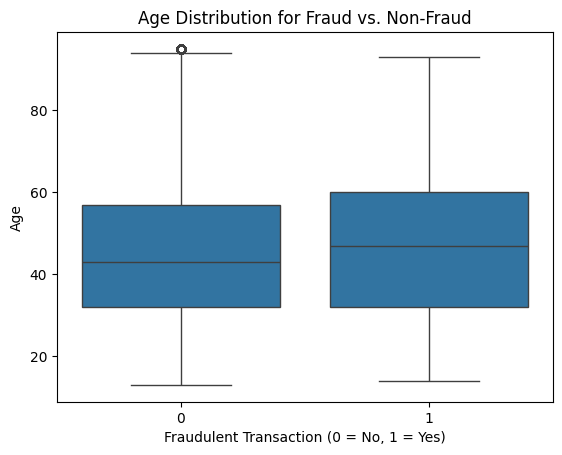

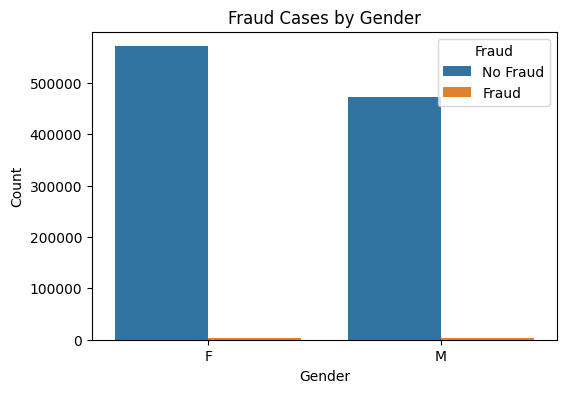

<ipython-input-7-ce6c28844022>:32: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=fraud_percentage.index, y=fraud_percentage.values, palette="coolwarm")


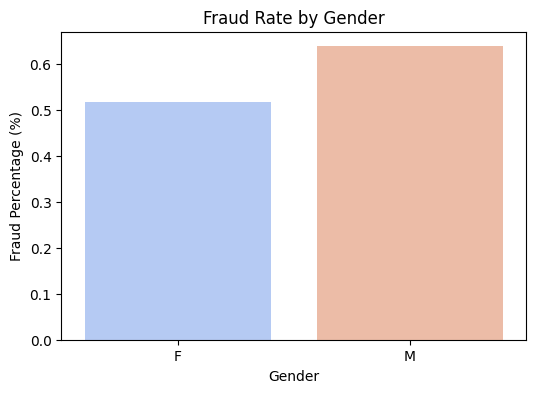

In [7]:
import seaborn as sns

# Convert date columns to datetime format
df["dob"] = pd.to_datetime(df["dob"])  # Date of birth
df["trans_date_trans_time"] = pd.to_datetime(df["trans_date_trans_time"])  # Date transaction happened

# Calculate age at time of fraud
df["age"] = (df["trans_date_trans_time"] - df["dob"]).dt.days // 365  # Convert days to years

# Convert fraud column to 1 (fraud) and 0 (non-fraud)
df["is_fraud"] = df["is_fraud"].astype(int)

# Age Boxplot
sns.boxplot(x=df["is_fraud"], y=df["age"])
plt.xlabel("Fraudulent Transaction (0 = No, 1 = Yes)")
plt.ylabel("Age")
plt.title("Age Distribution for Fraud vs. Non-Fraud")
plt.show()

# Gender Boxplot
plt.figure(figsize=(6, 4))
sns.countplot(x="gender", hue="is_fraud", data=df)
plt.xlabel("Gender")
plt.ylabel("Count")
plt.title("Fraud Cases by Gender")
plt.legend(title="Fraud", labels=["No Fraud", "Fraud"])
plt.show()

# Show fraud percentage per gender
fraud_percentage = df.groupby("gender")["is_fraud"].mean() * 100
plt.figure(figsize=(6, 4))
sns.barplot(x=fraud_percentage.index, y=fraud_percentage.values, palette="coolwarm")
plt.xlabel("Gender")
plt.ylabel("Fraud Percentage (%)")
plt.title("Fraud Rate by Gender")
plt.show()

# **Conclusions from the Age Distribution Box Plot for Fraud vs. Non-Fraud:**

Fraud is Distributed Across All Age Groups

The age distribution for fraudulent transactions (1) and non-fraudulent transactions (0) is quite similar.
Fraud occurs across all age groups, from young adults to elderly individuals.

Slightly Higher Median Age for Fraudulent Transactions

The median age for fraud cases is slightly higher than for non-fraud cases.
This suggests that older individuals might be slightly more susceptible to fraud, but the difference is small.

Similar Spread of Ages in Both Groups

The interquartile ranges (middle 50% of data) overlap significantly.
Both groups have a wide range of ages, meaning age alone is not a strong predictor of fraud.

Outliers in the Non-Fraudulent Transactions

A few outliers in the non-fraud group (age 90+) suggest that some older individuals made transactions but were not involved in fraud.
The fraudulent group does not show extreme outliers, meaning fraud cases are fairly evenly distributed.

Key Takeaways

📌 Age does not appear to be a strong predictor of fraud.

📊 Fraud affects all age groups equally, with only a slightly higher median age for fraud cases.

🧐 Further analysis is needed to determine if other factors (e.g., job, gender, transaction amount) influence fraud risk. Fraudulent cases have a similar upper limit, but without distinct outliers.

# **Conclusions from the Gender Distribution Bar Graph for Fraud vs. Non-Fraud:**

Total Transactions by Gender (Count Chart)

The total number of transactions is higher for females (F) than for males (M).
Fraudulent transactions (orange bars) are very small compared to non-fraudulent transactions (blue bars) for both genders.
This suggests that fraud is a rare event across all transactions, regardless of gender.

Fraud Rate by Gender (Percentage Chart)

The fraud percentage is slightly higher for males (aprrox. 0.62%) than for females (approx. 0.52%).
Even though females had more total transactions, males have a higher fraud rate relative to their total transactions.

Implications

Males are slightly more likely to be involved in fraudulent transactions despite having fewer total transactions.
The difference in fraud rates is small (~0.1%), meaning gender alone is not a strong predictor of fraud.
Other factors, such as transaction amount, location, or job type, may have a bigger influence on fraud risk.

Key Takeaways

📌 Fraud occurs across both genders, with males having a slightly higher fraud rate.

📊 Total transactions are higher for females, but their fraud rate is slightly lower.

🧐 Gender alone does not strongly predict fraud risk; other factors should be considered.

In [8]:
import folium
import pandas as pd

# Load the dataset (Ensure it contains 'street', 'city', 'state', 'pop', 'lat', 'long', and 'fraud' columns)
# df = pd.read_csv("credit_card_transactions.csv")  # Update filename as needed
df = pd.read_csv(file_name)

# Convert fraud column to numeric (1 = Fraud, 0 = No Fraud)
df["is_fraud"] = df["is_fraud"].astype(int)

# Initialize a world map centered at an average location
world_map = folium.Map(location=[df["lat"].mean(), df["long"].mean()], zoom_start=4)

# Add markers for fraud cases
for _, row in df[df["is_fraud"] == 1].iterrows():
    location_info = f"""
        <b>Street:</b> {row['street']}<br>
        <b>City:</b> {row['city']}<br>
        <b>State:</b> {row['state']}<br>
        <b>Population:</b> {row['city_pop']}
    """

    folium.Marker(
        location=[row["lat"], row["long"]],
        popup=folium.Popup(location_info, max_width=250),
        icon=folium.Icon(color="red", icon="exclamation-triangle", prefix="fa"),
    ).add_to(world_map)

# Save map as an interactive HTML file
world_map.save("fraud_world_map.html")

# To display in Jupyter Notebook
world_map



# **Conclusions from the Fraud Location Map:**

Fraud is Widespread Across the U.S.

Fraud cases are not isolated to one region but are spread across the entire country, affecting both urban and rural areas.

Higher Fraud Concentration in Densely Populated Areas

Fraud cases are most concentrated in the Eastern U.S., particularly in states like New York, Pennsylvania, Florida, and Illinois.
The West Coast (California, Washington) also has significant fraud hotspots, likely due to higher transaction volumes.

Clusters Around Major Metropolitan Areas

High fraud density in cities such as:
New York City
Los Angeles
Chicago
Houston
Miami
This suggests fraud correlates with high transaction activity in major economic hubs.

Lower Fraud Incidence in Central U.S.

While fraud is still present, the Midwest and less populated states (e.g., Montana, Wyoming, North Dakota) have fewer fraud markers.
This may be due to lower transaction volume or different fraud tactics used in rural areas.

Possible Border-Related Fraud Trends

Some fraud markers are near the U.S.-Mexico border, particularly in Texas and California.
This could indicate cross-border fraud schemes, such as identity theft or money laundering.

Key Takeaways

📌 Fraud is highest in densely populated states and major metropolitan areas.

📊 Urban regions see significantly more fraud than rural areas.

🛑 Certain hotspots (New York, California, Florida) may need enhanced fraud prevention measures.

🧐 Further analysis could compare fraud cases with economic activity, transaction volume, or crime rates.